# 3D PCL

In [ ]:
import cv2
import json
import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt

from ..src.extract_defect_mask import (
    create_PCD_aligned,
    calc_gradient,
    filter_defect_points_by_roi,
    extract_largest_defect_cluster,
    expand_defect_with_convex_hull,
    create_defect_mask_image,
    postprocess_mask,
)


1. 2D DepthMap -> 3D PCL

In [ ]:
# 20cm: 1 2 3 
# 25cm: 4 5 6 
# 30cm: 7 8 9 10
# 35cm: 11 12 13
# 40cm: 14 15 16
depth_json_path = "../../../clay_dist/depths/3.json"
main_pcd_color = [0.008, 0.467, 0.741]

pcd= create_PCD_aligned(depth_json_path)
pcd.paint_uniform_color(main_pcd_color)   #0277BD
o3d.visualization.draw_plotly([pcd])

2. 기울기 급변 구간 탐색

In [38]:
# 가장 강한 gradient를 가진 점을 기준으로, 주변 점들 중 gradient 벡터의 z축 방향이 음수인 점만 추출
gradient_magnitude, _ = calc_gradient(pcd, 100)
defect_points, _ = filter_defect_points_by_roi(np.asarray(pcd.points), gradient_magnitude, percentile=90, roi_ratio=0.25)
defect_color = [1.0, 0.839, 0.0]  #FFD600

defect_pcd = o3d.geometry.PointCloud()
defect_pcd.points = o3d.utility.Vector3dVector(defect_points)
defect_pcd.paint_uniform_color(defect_color) 

o3d.visualization.draw_plotly([pcd, defect_pcd])


3. 영역 필터링

In [39]:
# 여러 검출 영역 중 넓은 영역만을 필터링
largest_defect_points = extract_largest_defect_cluster(defect_points, eps=0.05, min_samples=10)

# 시각화
expanded_pcd = o3d.geometry.PointCloud()
expanded_pcd.points = o3d.utility.Vector3dVector(largest_defect_points)
expanded_pcd.paint_uniform_color(defect_color)
o3d.visualization.draw_plotly([pcd, expanded_pcd])

4.Final Defect Region

클러스터의 외곽을 볼록하게 감싸며, 전체 결함 영역을 보완·확정

In [40]:
expanded = expand_defect_with_convex_hull(np.array(pcd.points), largest_defect_points)

# 시각화
pcd.paint_uniform_color(main_pcd_color)
expanded_pcd = o3d.geometry.PointCloud()
expanded_pcd.points = o3d.utility.Vector3dVector(expanded)
expanded_pcd.paint_uniform_color(defect_color)
o3d.visualization.draw_plotly([pcd, expanded_pcd])

(3D PCD 최종)

In [ ]:
# 20cm: 1 2 3 
# 25cm: 4 5 6 
# 30cm: 7 8 9 10
# 35cm: 11 12 13
# 40cm: 14 15 16
depth_json_path = "../../../clay_dist/depths/3.json"
pcd= create_PCD_aligned(depth_json_path)
main_pcd_color = [0.008, 0.467, 0.741]

# 가장 강한 gradient를 가진 점을 기준으로, 주변 점들 중 gradient 벡터의 z축 방향이 음수인 점만 추출
gradient_magnitude, _ = calc_gradient(pcd, 100)
defect_points, _ = filter_defect_points_by_roi(np.asarray(pcd.points), gradient_magnitude, percentile=89, roi_ratio=0.25)
defect_color = [1.0, 0.839, 0.0]  #FFD600

# 여러 검출 영역 중 넓은 영역만을 필터링
largest_defect_points = extract_largest_defect_cluster(defect_points, eps=0.05, min_samples=10)

expanded = expand_defect_with_convex_hull(np.array(pcd.points), largest_defect_points)

# 시각화
pcd.paint_uniform_color(main_pcd_color)
expanded_pcd = o3d.geometry.PointCloud()
expanded_pcd.points = o3d.utility.Vector3dVector(expanded)
expanded_pcd.paint_uniform_color(defect_color)
o3d.visualization.draw_plotly([pcd, expanded_pcd])


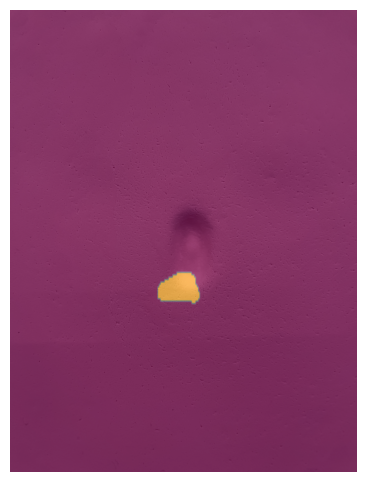

In [54]:
mask_img = create_defect_mask_image(np.array(pcd.points), expanded, image_size=(256, 192))
smooth_mask = postprocess_mask(mask_img)
smooth_mask = np.rot90(smooth_mask,-1)
resize_mask = cv2.resize(smooth_mask, (1440, 1920))

image_path = "../../../clay_data_image_iphone/images/3.jpg"
rgb_img = plt.imread(image_path)
                                      
plt.figure(figsize=(8, 6))
plt.imshow(rgb_img, alpha=1.0)
plt.imshow(resize_mask, alpha=0.5)
plt.axis('off')
plt.show()

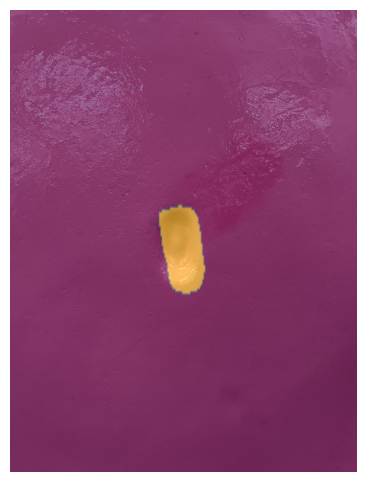

In [ ]:
# 20cm: 1 2 3 
# 25cm: 4 5 6 
# 30cm: 7 8 9 10
# 35cm: 11 12 13
# 40cm: 14 15 16

image_num = 3

depth_json_path = f"../../../clay_dist/depths/{image_num}.json"
pcd= create_PCD_aligned(depth_json_path)
points = np.asarray(pcd.points)
gradient_magnitude, _ = calc_gradient(pcd, 100)

defect_points, _ = filter_defect_points_by_roi(points, gradient_magnitude, percentile=90, roi_ratio=0.25)
largest_defect_points = extract_largest_defect_cluster(defect_points, eps=0.05, min_samples=10)
expanded = expand_defect_with_convex_hull(points, largest_defect_points)

mask_img = create_defect_mask_image(np.array(pcd.points), expanded, image_size=(256, 192))
smooth_mask = postprocess_mask(mask_img)
smooth_rot90_mask = np.rot90(smooth_mask,-1)
resize_mask = cv2.resize(smooth_rot90_mask, (1440, 1920))

image_path = "../../../clay_dist/images/3.jpg"
rgb_img = plt.imread(image_path)
                                      
plt.figure(figsize=(8, 6))
plt.imshow(rgb_img, alpha=1.0)
plt.imshow(resize_mask, alpha=0.5)
plt.axis('off')
plt.show()

지금 면적 계산은 2D로 투영된 마스크에서 픽셀 수를 세서 면적을 계산하지만, \
그 마스크의 물리적 크기(실제 너비와 높이)는 3차원 포인트 클라우드 좌표(real_point)의 X, Y 범위에서 가져옴

In [263]:
# 1) 실제 좌표 범위 파악
real_point = np.asarray(expanded_pcd.points)  # create_PCD_aligned() 결과(이미 평면 정렬됨)

x_min, x_max = real_point[:, 0].min(), real_point[:, 0].max()
y_min, y_max = real_point[:, 1].min(), real_point[:, 1].max()

#  PCD 좌표가 1 단위를 ‘1미터’가 아니라 ‘0.1미터(=10cm)’**로 보고 있음. 1 decimeter(10cm)
real_width_cm  = round((x_max - x_min)*10,3)   # cm
real_height_cm = round((y_max - y_min)*10,3)   # cm
print(f"real_height: {real_height_cm}cm, real_width: {real_width_cm}cm")

# 2) 해당 ROI가 이미지상에서 차지하는 픽셀 범위를 찾음
ys, xs = np.where(resize_mask > 0)  # 결함 영역 마스크 픽셀 좌표
roi_pixel_width = xs.max() - xs.min()
roi_pixel_height = ys.max() - ys.min()

# 3) 한 픽셀당 실제 사이즈
cm_per_pixel_x = real_width_cm / roi_pixel_width
cm_per_pixel_y = real_height_cm / roi_pixel_height

# 4) 마스크 픽셀 수 & 실제 면적
defect_pixel_count = np.sum(resize_mask > 0)
defect_area_cm2 = defect_pixel_count * cm_per_pixel_x * cm_per_pixel_y

print("결함 픽셀 수:", defect_pixel_count)
print(f"결함 면적(약) = {defect_area_cm2:.2f} cm^2")


real_height: 2.825cm, real_width: 1.795cm
결함 픽셀 수: 37334
결함 면적(약) = 3.86 cm^2


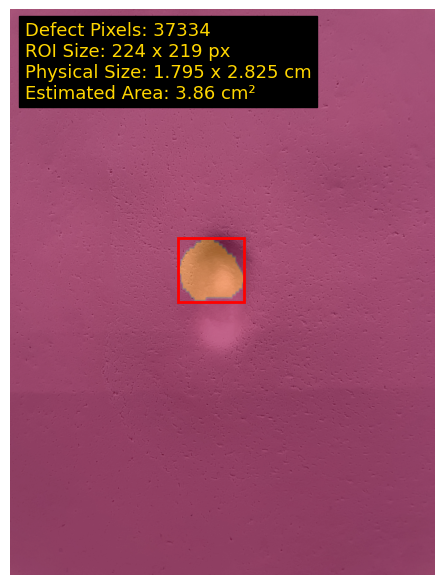

In [264]:
# 시각화: 결함 마스크 + ROI + 정보 텍스트 표시
fig, ax = plt.subplots(figsize=(5, 6))
resize_mask_192 = cv2.resize(smooth_rot90_mask, (192,256))
ax.imshow(rgb_img, alpha=1.0)
ax.imshow(resize_mask, alpha=0.3)

# ROI 박스
rect = plt.Rectangle((xs.min(), ys.min()),roi_pixel_width, roi_pixel_height,
                     edgecolor='red', facecolor='none', linewidth=2)
ax.add_patch(rect)

# 텍스트 박스 (영문 정보)
text_str = f"Defect Pixels: {defect_pixel_count}\n" \
           f"ROI Size: {roi_pixel_width} x {roi_pixel_height} px\n" \
           f"Physical Size: {real_width_cm} x {real_height_cm} cm\n" \
           f"Estimated Area: {defect_area_cm2:.2f} cm²"

ax.text(50, 300, text_str, fontsize=13, color='#FFD600', backgroundcolor='black')
# ax.set_title("Defect Mask with ROI and Measurement Info")
ax.axis('off')
plt.tight_layout()
plt.show()


In [245]:
text_str = f"Defect Pixels: {defect_pixel_count}\n" \
           f"ROI Size: {roi_pixel_width} x {roi_pixel_height} px\n" \
           f"Physical Size: {real_width_cm} x {real_height_cm} cm\n" \
           f"Estimated Area: {defect_area_cm2:.2f} cm²"
print(text_str)

Defect Pixels: 37436
ROI Size: 224 x 219 px
Physical Size: 1.795 x 2.825 cm
Estimated Area: 3.87 cm²
